Transaction fraud detection for Different type of payments:

In [65]:
#importing the all the dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

In [66]:
#Reading the dataset using pandas data-frame
Dataset = pd.read_csv(r"C:\Users\deepv\OneDrive\Desktop\Project\Fraud.csv")
Dataset.head()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0,0,0
1,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0,0,0
2,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0,1,0
3,1,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0,1,0
4,1,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0,0,0


In [35]:
#gathering information about the data
Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 11 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   step            1048575 non-null  int64  
 1   type            1048575 non-null  object 
 2   amount          1048575 non-null  float64
 3   nameOrig        1048575 non-null  object 
 4   oldbalanceOrg   1048575 non-null  float64
 5   newbalanceOrig  1048575 non-null  float64
 6   nameDest        1048575 non-null  object 
 7   oldbalanceDest  1048575 non-null  float64
 8   newbalanceDest  1048575 non-null  float64
 9   isFraud         1048575 non-null  int64  
 10  isFlaggedFraud  1048575 non-null  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 88.0+ MB


In [36]:
#Describing the Datset
Dataset.describe()

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1048575.0
mean,2.696617e+01,1.586670e+05,8.740095e+05,8.938089e+05,9.781600e+05,1.114198e+06,1.089097e-03,0.0
std,1.562325e+01,2.649409e+05,2.971751e+06,3.008271e+06,2.296780e+06,2.416593e+06,3.298351e-02,0.0
min,1.000000e+00,1.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0
25%,1.500000e+01,1.214907e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0
50%,2.000000e+01,7.634333e+04,1.600200e+04,0.000000e+00,1.263772e+05,2.182604e+05,0.000000e+00,0.0
75%,3.900000e+01,2.137619e+05,1.366420e+05,1.746000e+05,9.159235e+05,1.149808e+06,0.000000e+00,0.0
max,9.500000e+01,1.000000e+07,3.890000e+07,3.890000e+07,4.210000e+07,4.220000e+07,1.000000e+00,0.0


In [37]:
##showing the categories of payment types i.e. five categories of payment types 
Dataset["type"].value_counts()

CASH_OUT    373641
PAYMENT     353873
CASH_IN     227130
TRANSFER     86753
DEBIT         7178
Name: type, dtype: int64

C1214450722    2
C309111136     2
C1268675361    2
C720460198     2
C1109092856    2
              ..
C560131732     1
C455251560     1
C650578540     1
C1883668225    1
C1264356443    1
Name: nameOrig, Length: 1048317, dtype: int64

In [39]:
#Showing the number of records of type "step" in Dataset
Dataset["step"].value_counts()

19    51352
18    49579
43    45060
15    44609
17    43361
      ...  
67        6
54        4
76        4
28        4
29        4
Name: step, Length: 95, dtype: int64

In [40]:
#separating the string and numerics from the columns "nameOrig" and "nameDest"
Dataset["nameOrigString"] = Dataset["nameOrig"].str.extract(r'([A-Za-z])')
Dataset["nameOrigNumeric"] = Dataset["nameOrig"].str.extract(r'(\d+)').astype(int)

Dataset["nameDestString"] = Dataset["nameDest"].str.extract(r'([A-Za-z])')
Dataset["nameDestNumeric"] = Dataset["nameDest"].str.extract(r'(\d+)').astype(int)


Dataset.head(10)


,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,nameOrigString,nameOrigNumeric,nameDestString,nameDestNumeric
0,1,PAYMENT,9839.64,C1231006815,170136.00,160296.36,M1979787155,0.0,0.00,0,0,C,1231006815,M,1979787155
1,1,PAYMENT,1864.28,C1666544295,21249.00,19384.72,M2044282225,0.0,0.00,0,0,C,1666544295,M,2044282225
2,1,TRANSFER,181.00,C1305486145,181.00,0.00,C553264065,0.0,0.00,1,0,C,1305486145,C,553264065
3,1,CASH_OUT,181.00,C840083671,181.00,0.00,C38997010,21182.0,0.00,1,0,C,840083671,C,38997010
4,1,PAYMENT,11668.14,C2048537720,41554.00,29885.86,M1230701703,0.0,0.00,0,0,C,2048537720,M,1230701703
5,1,PAYMENT,7817.71,C90045638,53860.00,46042.29,M573487274,0.0,0.00,0,0,C,90045638,M,573487274
6,1,PAYMENT,7107.77,C154988899,183195.00,176087.23,M408069119,0.0,0.00,0,0,C,154988899,M,408069119
7,1,PAYMENT,7861.64,C1912850431,176087.23,168225.59,M633326333,0.0,0.00,0,0,C,1912850431,M,633326333
8,1,PAYMENT,4024.36,C1265012928,2671.00,0.00,M1176932104,0.0,0.00,0,0,C,1265012928,M,1176932104
9,1,DEBIT,5337.77,C712410124,41720.00,36382.23,C195600860,41898.0,40348.79,0,0,C,712410124,C,195600860


In [41]:
Dataset["nameOrigString"].value_counts()

C    1048575
Name: nameOrigString, dtype: int64

In [42]:
#"nameDestString" is the categorical data and below code showing the different counts of different categories
Dataset["nameDestString"].value_counts()

C    694702
M    353873
Name: nameDestString, dtype: int64

In [43]:
#droppinng the isflagged column
Dataset.drop(columns = ["isFlaggedFraud"])
Dataset.head(5)

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,nameOrigString,nameOrigNumeric,nameDestString,nameDestNumeric
0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0,0,0,C,1231006815,M,1979787155
1,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0,0,0,C,1666544295,M,2044282225
2,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0,1,0,C,1305486145,C,553264065
3,1,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0,1,0,C,840083671,C,38997010
4,1,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0,0,0,C,2048537720,M,1230701703


In [44]:
#one hot encoding : 
#encoding of column "type" into numerical form using one hot encoding
dummies = pd.get_dummies(Dataset.type)
dummies

  

,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
0,0,0,0,1,0
1,0,0,0,1,0
2,0,0,0,0,1
3,0,1,0,0,0
4,0,0,0,1,0
...,...,...,...,...,...
1048570,0,1,0,0,0
1048571,0,0,0,1,0
1048572,0,0,0,1,0
1048573,0,0,0,1,0


In [45]:
#merging the old dataset with one hot encoded data i.e. "dummies" and resultant dataset is "DatasetNew" 
DatasetNew = pd.concat([Dataset, dummies], axis = 'columns')
DatasetNew.head(10)

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,nameOrigString,nameOrigNumeric,nameDestString,nameDestNumeric,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
0,1,PAYMENT,9839.64,C1231006815,170136.00,160296.36,M1979787155,0.0,0.00,0,0,C,1231006815,M,1979787155,0,0,0,1,0
1,1,PAYMENT,1864.28,C1666544295,21249.00,19384.72,M2044282225,0.0,0.00,0,0,C,1666544295,M,2044282225,0,0,0,1,0
2,1,TRANSFER,181.00,C1305486145,181.00,0.00,C553264065,0.0,0.00,1,0,C,1305486145,C,553264065,0,0,0,0,1
3,1,CASH_OUT,181.00,C840083671,181.00,0.00,C38997010,21182.0,0.00,1,0,C,840083671,C,38997010,0,1,0,0,0
4,1,PAYMENT,11668.14,C2048537720,41554.00,29885.86,M1230701703,0.0,0.00,0,0,C,2048537720,M,1230701703,0,0,0,1,0
5,1,PAYMENT,7817.71,C90045638,53860.00,46042.29,M573487274,0.0,0.00,0,0,C,90045638,M,573487274,0,0,0,1,0
6,1,PAYMENT,7107.77,C154988899,183195.00,176087.23,M408069119,0.0,0.00,0,0,C,154988899,M,408069119,0,0,0,1,0
7,1,PAYMENT,7861.64,C1912850431,176087.23,168225.59,M633326333,0.0,0.00,0,0,C,1912850431,M,633326333,0,0,0,1,0
8,1,PAYMENT,4024.36,C1265012928,2671.00,0.00,M1176932104,0.0,0.00,0,0,C,1265012928,M,1176932104,0,0,0,1,0
9,1,DEBIT,5337.77,C712410124,41720.00,36382.23,C195600860,41898.0,40348.79,0,0,C,712410124,C,195600860,0,0,1,0,0


In [46]:
#Dropping the irrelevant columns from the Dataset and cleaning the Dataset  
final = DatasetNew.drop(["type", "nameOrig", "nameDest", "isFlaggedFraud", "nameOrigString", "nameDestString"], axis = 'columns')
final   

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,nameOrigNumeric,nameDestNumeric,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
0,1,9839.64,170136.00,160296.36,0.00,0.00,0,1231006815,1979787155,0,0,0,1,0
1,1,1864.28,21249.00,19384.72,0.00,0.00,0,1666544295,2044282225,0,0,0,1,0
2,1,181.00,181.00,0.00,0.00,0.00,1,1305486145,553264065,0,0,0,0,1
3,1,181.00,181.00,0.00,21182.00,0.00,1,840083671,38997010,0,1,0,0,0
4,1,11668.14,41554.00,29885.86,0.00,0.00,0,2048537720,1230701703,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,95,132557.35,479803.00,347245.65,484329.37,616886.72,0,1179511630,435674507,0,1,0,0,0
1048571,95,9917.36,90545.00,80627.64,0.00,0.00,0,1956161225,668364942,0,0,0,1,0
1048572,95,14140.05,20545.00,6404.95,0.00,0.00,0,2037964975,1355182933,0,0,0,1,0
1048573,95,10020.05,90605.00,80584.95,0.00,0.00,0,1633237354,1964992463,0,0,0,1,0


Data visualization 

In [67]:
#Comparing the fraud transaction and Normal transaction using Histogram visual representation
fig = px.histogram(final, x = 'isFraud', title = "IsFraud Histogram(ratio of normal and fraud transaction)", nbins = 2)
fig.show()

<AxesSubplot:xlabel='step', ylabel='type'>

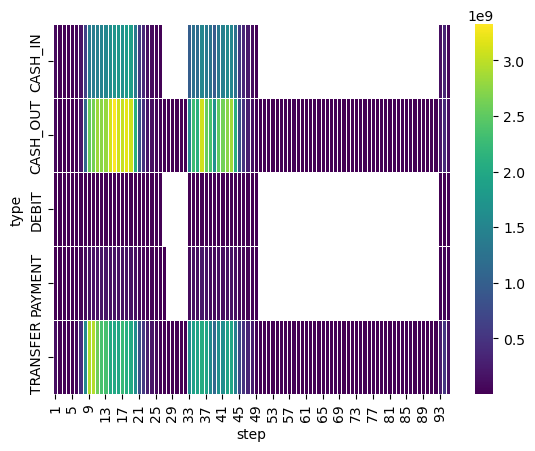

In [48]:
#plotting the heatmap among the data points "step", "type", and "balance"
H = DatasetNew.pivot_table(index = "type", columns = "step", values = "amount", aggfunc = "sum")
sns.heatmap(H, linewidths = 0.5, fmt = 'd', cmap = 'viridis')

balancing the Dataset 

In [49]:
#The Data Balancing is required  
fraud = final[final['isFraud']==1]
normal = final[final['isFraud']==0]

In [50]:
print(fraud.shape, normal.shape)

(1142, 14) (1047433, 14)


In [51]:
#performing the oversampling on the dataset to balance the dataset
normalSample = normal.sample(n = 1142)
normalSample

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,nameOrigNumeric,nameDestNumeric,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
418238,18,134214.82,3441889.77,3576104.59,4449691.77,4315476.95,0,761713614,1698182746,1,0,0,0,0
283702,15,27176.29,340112.93,312936.64,456251.00,709955.70,0,1175763754,410113323,0,0,0,0,1
68454,9,267738.55,10410.00,0.00,1679411.22,1964212.00,0,1416391191,1734649556,0,1,0,0,0
1031203,93,341238.15,4734056.97,5075295.12,612813.87,271575.72,0,1748716716,444589028,1,0,0,0,0
351629,17,201255.22,0.00,0.00,359547.74,702280.71,0,206460405,1864084023,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207738,13,126855.27,0.00,0.00,6124410.75,6251266.02,0,1602923059,1957476230,0,1,0,0,0
360472,17,40044.08,0.00,0.00,148172.55,188216.62,0,143737,1387567249,0,1,0,0,0
294851,15,735.96,342832.45,342096.49,0.00,0.00,0,1105936377,785609138,0,0,0,1,0
1040846,94,107901.35,347.00,108248.35,553364.51,445463.16,0,240972700,1513436007,1,0,0,0,0


In [52]:
#merging the normal sample dataset with fraud dataset and new dataset is "finalNew".
finalNew = pd.concat([normalSample, fraud])
finalNew

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,nameOrigNumeric,nameDestNumeric,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
418238,18,134214.82,3441889.77,3576104.59,4449691.77,4315476.95,0,761713614,1698182746,1,0,0,0,0
283702,15,27176.29,340112.93,312936.64,456251.00,709955.70,0,1175763754,410113323,0,0,0,0,1
68454,9,267738.55,10410.00,0.00,1679411.22,1964212.00,0,1416391191,1734649556,0,1,0,0,0
1031203,93,341238.15,4734056.97,5075295.12,612813.87,271575.72,0,1748716716,444589028,1,0,0,0,0
351629,17,201255.22,0.00,0.00,359547.74,702280.71,0,206460405,1864084023,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047888,95,56745.14,56745.14,0.00,51433.88,108179.02,1,526144262,79051264,0,1,0,0,0
1048221,95,33676.59,33676.59,0.00,0.00,0.00,1,732111322,1140210295,0,0,0,0,1
1048222,95,33676.59,33676.59,0.00,0.00,33676.59,1,1000086512,1759363094,0,1,0,0,0
1048323,95,87999.25,87999.25,0.00,0.00,0.00,1,927181710,757947873,0,0,0,0,1


In [53]:
#getting description of the Dataset
finalNew.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2284 entries, 418238 to 1048324
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   step             2284 non-null   int64  
 1   amount           2284 non-null   float64
 2   oldbalanceOrg    2284 non-null   float64
 3   newbalanceOrig   2284 non-null   float64
 4   oldbalanceDest   2284 non-null   float64
 5   newbalanceDest   2284 non-null   float64
 6   isFraud          2284 non-null   int64  
 7   nameOrigNumeric  2284 non-null   int32  
 8   nameDestNumeric  2284 non-null   int32  
 9   CASH_IN          2284 non-null   uint8  
 10  CASH_OUT         2284 non-null   uint8  
 11  DEBIT            2284 non-null   uint8  
 12  PAYMENT          2284 non-null   uint8  
 13  TRANSFER         2284 non-null   uint8  
dtypes: float64(5), int32(2), int64(2), uint8(5)
memory usage: 171.7 KB


In [54]:
finalNew['isFraud'].value_counts()

0    1142
1    1142
Name: isFraud, dtype: int64

In [55]:
#splitting the data into features and targets
x = finalNew.drop(columns = 'isFraud', axis  = 1)
y = finalNew['isFraud']

#splitting the data into train and test Datasets :


In [56]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [57]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, stratify = y, random_state=2)

In [58]:
print(x.shape, x_train.shape, x_test.shape)

(2284, 13) (1827, 13) (457, 13)


#model creating and training the model

In [71]:
#creating the model i.e. logistic regression
model = LogisticRegression()


In [72]:
model.fit(x_train, y_train)

C:\Users\deepv\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()



#model evaluation :::



In [73]:
#model evaluation :::
x_train_prediction = model.predict(x_train)
training_Data_accuraccy = accuracy_score(x_train_prediction, y_train)
print("Model accuraccy on training Data :", training_Data_accuraccy)


Model accuraccy on training Data : 0.8522167487684729


model Accuracy

In [74]:
x_test_prediction = model.predict(x_test)
testining_Data_accuraccy = accuracy_score(x_test_prediction, y_test)

In [75]:
print("Model accuraccy on testing Data :", testining_Data_accuraccy)

Model accuraccy on testing Data : 0.8468271334792122
